In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score, roc_auc_score, confusion_matrix, roc_curve
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis
import requests
from sklearn.neighbors import KernelDensity
from scipy.signal import find_peaks
from sklearn.utils import resample
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Lab 4

Мы выбрали Medical Appointments No-Show датасет https://data.mendeley.com/datasets/wm6w2fvkfj/1

Человек записывается к врачу, получает все указания и не появляется. Кого винить?

Описание колонок:
1. "Specialty": specialty that patient received the treatment;
2. "Appointment Time": appointment time scheduled;
3. "Gender": male or female gender of the patient;
4. "Appointment Date": appointment date scheduled;
5. "No-show": given whether the patient attended the scheduled appointment or not;
6. "No-show Reason": description of the reason why the patient did not attend the scheduled appointment;
7. "Disability”: the patient’s motor or intellectual disability;
8. "Date of Birth": the patient’s date of birth;
9. "Date of Entry into the Service": date of the patient’s first appointment at the CER;
10. "City": city where the patient resides;
11. "ICD": identifier of the patient’s disease;
12. "Appointment Month";
13. "Appointment Year";
14. "Appointment Shift";
15. "Age": patient's age;
16. "Under 12 years old": patient's age under 12 years old;
17. "Over 60 years old": patient's age over 60 years old;
18. "Patient needs companion": patient's needs companion to go to the appointment;
19. "Patient needs companion": patient's needs companion to go to the appointment;
20. "Average Temperatura Day": Average temperatura in the day of the appointment;
21. "Average Rain Day": Average rain in the day of the appointment;
22. "Max Temperature Day": Maximum temperature in the day of the appointment;
23. "Max Rain Day": Maximum rainfall in the day of the appointment;
24. "Storm Day Before": Heavy rain in the day before the appointment;
25. "Rain Intensity": no rain, weak, moderate or heavy rain in the day of the appointment;
26. "Heat Intensity": cold, heavy cold, warm, heavy warm or mild in the day of the appointment;

Our goal is to predict **No-show**

Взглянем на данные, типы и их общий внешний вид

In [ ]:
file_id = "1kQfRDlGIAh2QdbB7h4zeBgUKQuVHdADD"
url = f"https://drive.google.com/uc?export=download&id={file_id}"

output_path = "medical-appointments-no-show-en.csv"


In [ ]:
session = requests.Session()
response = session.get(url, stream=True)

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith("download_warning"):
            return value
    return None

token = get_confirm_token(response)
if token:
    url = f"https://drive.google.com/uc?export=download&id={file_id}&confirm={token}"
    response = session.get(url, stream=True)

with open(output_path, "wb") as f:
    for chunk in response.iter_content(32768):
        if chunk:
            f.write(chunk)

print("Downloaded:", output_path)

Downloaded: medical-appointments-no-show-en.csv


In [ ]:
df = pd.read_csv('medical-appointments-no-show-en.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49593 entries, 0 to 49592
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   specialty                42139 non-null  object 
 1   appointment_time         49593 non-null  object 
 2   gender                   49593 non-null  object 
 3   appointment_date         49593 non-null  object 
 4   no_show                  49593 non-null  object 
 5   no_show_reason           1737 non-null   object 
 6   disability               44456 non-null  object 
 7   date_of_birth            39272 non-null  object 
 8   entry_service_date       44438 non-null  object 
 9   city                     44412 non-null  object 
 10  icd                      10717 non-null  object 
 11  appointment_month        49593 non-null  object 
 12  appointment_year         49593 non-null  int64  
 13  appointment_shift        49593 non-null  object 
 14  age                   

In [ ]:
df.dtypes

,0
specialty,object
appointment_time,object
gender,object
appointment_date,object
no_show,object
no_show_reason,object
disability,object
date_of_birth,object
entry_service_date,object
city,object


In [ ]:
df.head()

,specialty,appointment_time,gender,appointment_date,no_show,no_show_reason,disability,date_of_birth,entry_service_date,city,...,over_60_years_old,patient_needs_companion,average_temp_day,average_rain_day,max_temp_day,max_rain_day,rainy_day_before,storm_day_before,rain_intensity,heat_intensity
0,physiotherapy,13:20,M,09/09/2021,yes,surto,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
1,psychotherapy,13:20,M,09/09/2021,no,NaN,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
2,speech therapy,13:20,F,09/09/2021,no,NaN,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
3,physiotherapy,13:20,F,09/09/2021,no,NaN,NaN,NaN,NaN,NaN,...,0,0,20.75,0.01,23.7,0.2,1,1,no_rain,mild
4,physiotherapy,14:00,M,09/09/2021,no,NaN,motor,10/10/1954,5/2/2020,B. CAMBORIU,...,1,1,20.75,0.01,23.7,0.2,1,1,no_rain,mild


In [ ]:
df.dtypes

,0
specialty,object
appointment_time,object
gender,object
appointment_date,object
no_show,object
no_show_reason,object
disability,object
date_of_birth,object
entry_service_date,object
city,object


In [ ]:
for col in df.columns:
    print(f"Unique values in column '{col}':")
    print(df[col].unique())
    print("\n")

Unique values in column 'specialty':
['physiotherapy' 'psychotherapy' 'speech therapy' 'occupational therapy'
 nan 'enf' 'assist' 'pedagogo' 'sem especialidade']


Unique values in column 'appointment_time':
['13:20' '14:00' '14:40' '15:20' '16:20' '17:00' '17:40' '07:20' '08:00'
 '08:40' '10:20' '11:00' '11:40' '09:20' '13:00' '13:30' '16:40' '16:00'
 '15:00' '15:40' '08:50' '09:40' '10:50' '07:00' '09:30' '16:35' '13:50'
 '15:30' '18:15' '17:25' '14:50' '17:20' '08:20' '09:10' '10:30' '11:20'
 '07:30' '18:00' '07:50' '12:20' '14:20' '15:10' '17:10' '16:30' '11:10'
 '12:00' '08:30' '13:15' '15:50' '09:45' '10:35' '10:00' '09:50' '13:40'
 '13:05' '12:10' '09:00' '11:30' '13:10' '14:30' '16:15' '10:40' '16:10'
 '15:15' '10:10' '08:10' '18:20' '16:36' '17:36' '17:15' '14:10' '17:35'
 '16:50' '09:03']


Unique values in column 'gender':
['M' 'F' 'I']


Unique values in column 'appointment_date':
['09/09/2021' '09/09/2019' '09/08/2021' ... '01/07/2016' '01/03/2021'
 '01/02/2022']


Unique 

In [ ]:
# df["appointment_date"] = pd.to_datetime(df["appointment_date"], errors="coerce"). # later
df["date_of_birth"] = pd.to_datetime(df["date_of_birth"], errors="coerce")
df["entry_service_date"] = pd.to_datetime(df["entry_service_date"], errors="coerce")


Мы видим много NaN значение и других немного странных вещей, так как в датасете реальные данные. В целом, нам не нужны разные виды ID, так что извлечём несколько информативных предикторов

Несмотря на то, что датасет может быть интерпретируем как time series, мы будем упрощать, извлекая несколько признаков и полагаясь на них для предсказания

## Processing and analysis

### Visualization

In [ ]:
numeric_cols = ["age", "average_temp_day", "average_rain_day",
                "max_temp_day", "max_rain_day"]

binary_cols = ["under_12_years_old", "patient_needs_companion",
               "rainy_day_before", "storm_day_before"]

categorical_cols = ["specialty", "disability", "appointment_month",
                    "rain_intensity", "heat_intensity",
                    "appointment_shift", "gender"]

target = "no_show"

In [ ]:
X_corr = df[numeric_cols + binary_cols].copy()
y = df[target]

if y.dtype == "O" or str(y.dtype).startswith("category"):
    y_codes = y.astype("category").cat.codes  # 0,1,...
else:
    y_codes = y.astype("float")

X_corr[target] = y_codes

print("X_corr dtypes:")
print(X_corr.dtypes)

corr_df = X_corr.select_dtypes(include="number").corr(method="pearson")
print("Корреляционная матрица (первые строки):")
print(corr_df.head())

print("Есть ли все-NaN столбцы:", corr_df.isna().all())

fig = px.imshow(
    corr_df,
    text_auto=".2f",
    color_continuous_scale="RdBu",
    origin="lower",
    title="Корреляционная матрица (Pearson) для признаков и no_show"
)
fig.update_layout(
    xaxis_title="Признаки / no_show",
    yaxis_title="Признаки / no_show"
)
fig.show()


X_corr dtypes:
age                        float64
average_temp_day           float64
average_rain_day           float64
max_temp_day               float64
max_rain_day               float64
under_12_years_old           int64
patient_needs_companion      int64
rainy_day_before             int64
storm_day_before             int64
no_show                       int8
dtype: object
Корреляционная матрица (первые строки):
                       age  average_temp_day  average_rain_day  max_temp_day  \
age               1.000000          0.021405         -0.005181      0.023538   
average_temp_day  0.021405          1.000000          0.106930      0.879110   
average_rain_day -0.005181          0.106930          1.000000     -0.028136   
max_temp_day      0.023538          0.879110         -0.028136      1.000000   
max_rain_day     -0.000100          0.199007          0.841070      0.112381   

                  max_rain_day  under_12_years_old  patient_needs_companion  \
age                  

In [ ]:
scatter_cols = numeric_cols + binary_cols

labels = {c: c.replace("_", " ") for c in scatter_cols}

fig = px.scatter_matrix(
    df,
    dimensions=scatter_cols,
    color=target,
    labels=labels,
    title="Scatterplot matrix для числовых и бинарных признаков (цвет = no_show)",
    height=950,
    width=950
)

fig.update_traces(
    diagonal_visible=False,
    showupperhalf=False,
    marker=dict(opacity=0.4, size=3)
)

fig.update_layout(
    margin=dict(l=90, r=40, t=80, b=90),
    font=dict(size=9)
)
fig.update_xaxes(automargin=True)
fig.update_yaxes(automargin=True)

fig.show()


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

vif_features = numeric_cols + binary_cols
X = df[vif_features].dropna().copy()
X_const = sm.add_constant(X)

vif_data = []

for i, col in enumerate(X_const.columns):
    if col == "const":
        continue
    vif_value = variance_inflation_factor(X_const.values, i)
    vif_data.append({"feature": col, "VIF": vif_value})

vif_df = pd.DataFrame(vif_data).sort_values("VIF", ascending=False)
vif_df

/usr/local/lib/python3.12/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning:

divide by zero encountered in scalar divide



,feature,VIF
5,under_12_years_old,15.695181
6,patient_needs_companion,9.741298
0,age,5.261978
3,max_temp_day,4.818439
1,average_temp_day,4.762492
2,average_rain_day,3.805514
4,max_rain_day,3.720805
7,rainy_day_before,0.000000
8,storm_day_before,0.000000


### Missing values

Цель: определить пропущенные значения в каждой переменной. Выбрать подходящую стратегию для их обработки (например, заполнение, удаление) и обосновать свой выбор. Для этой цели можно использовать значения, взятые из одномерного распределения или подстановку с моментами (среднее, медиана) распределения.

Посмотрим на то, в каких признаках вообще наблюдаеются пропуски.
Предварительно создадим таблицу только тех признаков, которые мы выбираем в качестве предикторов.

Во-первых, сразу преобразуем пропуски или пробельные строки в nan для категориальных признаков

In [ ]:
for categoric_feature in categorical_cols + binary_cols:
    df[categoric_feature] = df[categoric_feature].replace(r'^\s*$', np.nan, regex=True)

In [ ]:
in_use_cols = numeric_cols + binary_cols + categorical_cols + ['appointment_date'] + ['no_show']
print(f'FEATURES IN USE: {in_use_cols}')
cleared_from_null_df = df[in_use_cols].copy()

FEATURES IN USE: ['age', 'average_temp_day', 'average_rain_day', 'max_temp_day', 'max_rain_day', 'under_12_years_old', 'patient_needs_companion', 'rainy_day_before', 'storm_day_before', 'specialty', 'disability', 'appointment_month', 'rain_intensity', 'heat_intensity', 'appointment_shift', 'gender', 'appointment_date', 'no_show']


In [ ]:
import pandas as pd
import plotly.express as px

def analyze_missing_values_by_column(df):
    total_rows = len(df)

    missing_analysis = pd.DataFrame({
        'column': df.columns,
        'missing_count': df.isnull().sum().values
    })

    missing_analysis['missing_percent'] = (missing_analysis['missing_count'] / total_rows * 100)
    missing_df = missing_analysis[missing_analysis['missing_count'] > 0].sort_values('missing_percent',
                                                                                     ascending=False)

    if len(missing_df) == 0:
        return "No more missing values!"

    print(missing_df)

    fig = px.bar(
        missing_df,
        x='column',
        y='missing_percent',
        title='Missing values percent by column',
        labels={'missing_percent': 'Missing values percent', 'column': 'columns'},
        color='missing_percent',
        color_continuous_scale='Reds'
    )
    fig.update_layout(
        xaxis_tickangle=-45,
        height=500,
        showlegend=False
    )
    fig.show()

analyze_missing_values_by_column(cleared_from_null_df)

              column  missing_count  missing_percent
0                age          10350        20.869881
9          specialty           7454        15.030347
10        disability           5146        10.376464
2   average_rain_day           1016         2.048676
1   average_temp_day           1016         2.048676
4       max_rain_day           1016         2.048676
3       max_temp_day           1016         2.048676


Будем придерживаться идеи, что нам важен каждый сэмпл и лучше заполнить пропуски, чем просто убрать эти записи.

На самом деле проще удалить 2 процента всех кортежей по признакам `average_rain_day`, `average_temp_day`, `max_rain_day`, `max_temp_day`, если в них содержатся пропуски значений, чем выстраивать стратегию заполнения.

...

20. "Average Temperatura Day": Average temperatura in the day of the appointment;
21. "Average Rain Day": Average rain in the day of the appointment;
22. "Max Temperature Day": Maximum temperature in the day of the appointment;
23. "Max Rain Day": Maximum rainfall in the day of the appointment;

...

Из описания этих четырех признаков понятно, что они в целом зависят от дня `appointment_date`, поэтому проанализуруем, есть ли вообще записи с таким же значением `appointment_date`, но без пропусков.

In [ ]:
date_col = 'appointment_date'
cleared_from_null_df[date_col] = pd.to_datetime(
    cleared_from_null_df[date_col],
    format='%d/%m/%Y',  # DD/MM/YYYY
    dayfirst=True,
    errors='coerce'
)

weather_cols = ['average_rain_day', 'average_temp_day', 'max_rain_day', 'max_temp_day']

missing_weather_values = cleared_from_null_df[weather_cols].isnull().sum()
print(f"Missing values before filling:\n{missing_weather_values}")
print(f"\nTotal samples: {len(df)}")

Missing values before filling:
average_rain_day    1016
average_temp_day    1016
max_rain_day        1016
max_temp_day        1016
dtype: int64

Total samples: 49593


Попытаемся заполнить пропуски средним значением тех же фичей по тем же датам. Будем надеяться на то, что в день приема были другие пациенты, у которых значение погодных признаков было указано.

In [ ]:
def fill_with_date_mean(df, date_col, value_col):
    date_means = df.groupby(date_col)[value_col].mean()
    date_mean_dict = date_means.to_dict()

    df[value_col] = df.apply(
        lambda row: date_mean_dict.get(row[date_col]) if pd.isna(row[value_col]) else row[value_col],
        axis=1
    )

    return df

for col in weather_cols:
    cleared_from_null_df = fill_with_date_mean(cleared_from_null_df, date_col, col)

print("Filled weather-related values using date-based filling:",
 int((cleared_from_null_df[weather_cols].isnull().sum() - missing_weather_values).sum()))

Filled weather-related values using date-based filling: 0


Оказалось, что нет. Получается, что подобная стратегия нам не подойдет.
Пропуски значений этих погодных признаков консистенты по дням.

То есть если уж значение в сэмпле не указано, то в этот день вообще не будет значений этого признака в нашем датасете.

Определим даты, семплы которых содержат пропуски в `average_rain_day`, `average_temp_day`, `max_rain_day`, `max_temp_day` признаках.

In [ ]:
nan_dates_weather = cleared_from_null_df.loc[cleared_from_null_df[weather_cols].isnull().any(axis=1), 'appointment_date'].unique()
print(f"Dates that still have NaN values in weather cols: {len(nan_dates_weather)}")

Dates that still have NaN values in weather cols: 32


Посмотрим на даты, когда мы недополучили информацию о погоде

In [ ]:
nan_dates_weather

<DatetimeArray>
['2020-12-09 00:00:00', '2020-11-04 00:00:00', '2022-01-31 00:00:00',
 '2022-01-28 00:00:00', '2022-01-27 00:00:00', '2022-01-26 00:00:00',
 '2020-11-25 00:00:00', '2022-02-25 00:00:00', '2022-01-25 00:00:00',
 '2022-02-24 00:00:00', '2022-01-24 00:00:00', '2022-02-23 00:00:00',
 '2022-02-22 00:00:00', '2022-02-21 00:00:00', '2020-12-02 00:00:00',
 '2020-11-18 00:00:00', '2022-02-18 00:00:00', '2022-02-17 00:00:00',
 '2020-12-16 00:00:00', '2022-02-16 00:00:00', '2022-02-15 00:00:00',
 '2022-02-14 00:00:00', '2020-11-11 00:00:00', '2022-02-11 00:00:00',
 '2022-02-10 00:00:00', '2022-02-09 00:00:00', '2022-02-08 00:00:00',
 '2022-02-07 00:00:00', '2022-02-04 00:00:00', '2022-02-03 00:00:00',
 '2022-02-02 00:00:00', '2022-02-01 00:00:00']
Length: 32, dtype: datetime64[ns]

И посмотрим на то, как выглядят эти пропуски на усредненных по дням сэмплах

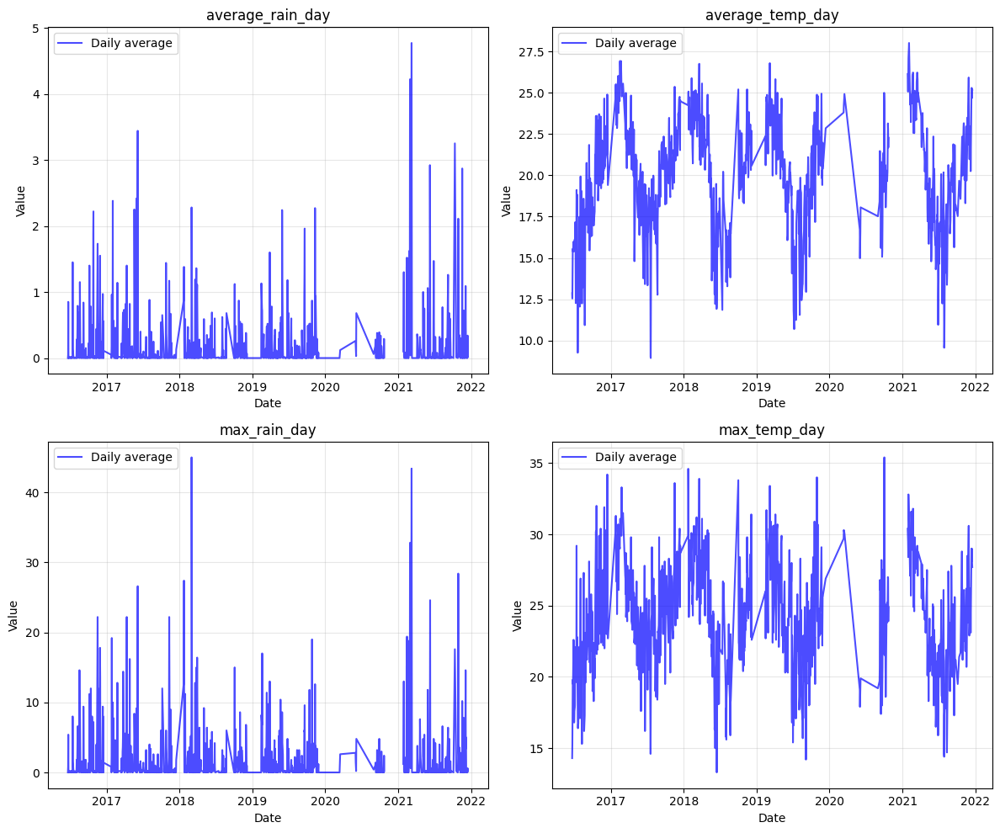

Summary statistics after filling:
       average_rain_day  average_temp_day  max_rain_day  max_temp_day
count      48577.000000      48577.000000  48577.000000  48577.000000
mean           0.190119         19.748317      1.895687     23.961984
std            0.452214          3.428767      4.445412      3.819804
min            0.000000          8.940000      0.000000     13.300000
25%            0.000000         17.480000      0.000000     21.400000
50%            0.010000         20.060000      0.200000     23.900000
75%            0.150000         22.120000      1.600000     26.500000
max            4.770000         28.010000     45.000000     35.400000


In [ ]:
import matplotlib.pyplot as plt

def visualize_gaps(df, date_col, weather_cols):
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.ravel()

    for idx, col in enumerate(weather_cols):
        ax = axes[idx]
        daily_avg = df.groupby(date_col)[col].mean().reset_index()

        ax.plot(daily_avg[date_col], daily_avg[col], 'b-', alpha=0.7, label='Daily average')
        ax.set_title(f'{col}')
        ax.set_xlabel('Date')
        ax.set_ylabel('Value')
        ax.legend()
        ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print("Summary statistics after filling:")
    print(df[weather_cols].describe())

visualize_gaps(cleared_from_null_df, date_col=date_col, weather_cols=weather_cols)

Видимо, кто-то уже заполнял пропуски в этих признаках до нас

Мы будем использовать иерархический метод для поиска ближайших доступных значений в пределах временного окна.

Сначала проверим данные за ближайшие дни, начиная с одного дня и постепенно увеличивая радиус до заданного окна (7 дней в обе стороны от текущей даты) до первого найденного значения.

Если в пределах заданного окна нет вещественных значений, обращаемся к сезонным паттернам, вычисляя среднее значение для соответствующего месяца.

In [ ]:
from datetime import timedelta

def fill_weather_with_neighbors(df, date_col, weather_cols, window=7):
    df = df.sort_values(date_col).reset_index(drop=True)

    for col in weather_cols:
        nan_indices = df.index[df[col].isnull()].tolist()

        for idx in nan_indices:
            current_date = df.at[idx, date_col]
            best_value = None
            best_distance = float('inf')

            for offset in range(1, window + 1):
                found_value = False

                for direction in [-1, 1]:
                    check_date = current_date + timedelta(days=offset * direction)
                    same_date_rows = df[df[date_col] == check_date]
                    if not same_date_rows.empty:
                        values = same_date_rows[col].dropna()
                        if not values.empty:
                            candidate_value = values.mean()
                            if best_distance > offset:
                                best_value = candidate_value
                                best_distance = offset
                                found_value = True
                if found_value:
                    break

            if best_value is not None:
                df.at[idx, col] = best_value
            else:
                month = current_date.month
                month_values = df[(df[date_col].dt.month == month) & (df[col].notnull())][col]
                df.at[idx, col] = month_values.mean()

    return df

cleared_from_null_df = fill_weather_with_neighbors(
    cleared_from_null_df,
    date_col=date_col,
    weather_cols=weather_cols,
    window=7
)

In [ ]:
missing_weather_after = cleared_from_null_df[weather_cols].isnull().sum()
print(f"Missing values after filling:\n{missing_weather_after}")

Missing values after filling:
average_rain_day    0
average_temp_day    0
max_rain_day        0
max_temp_day        0
dtype: int64


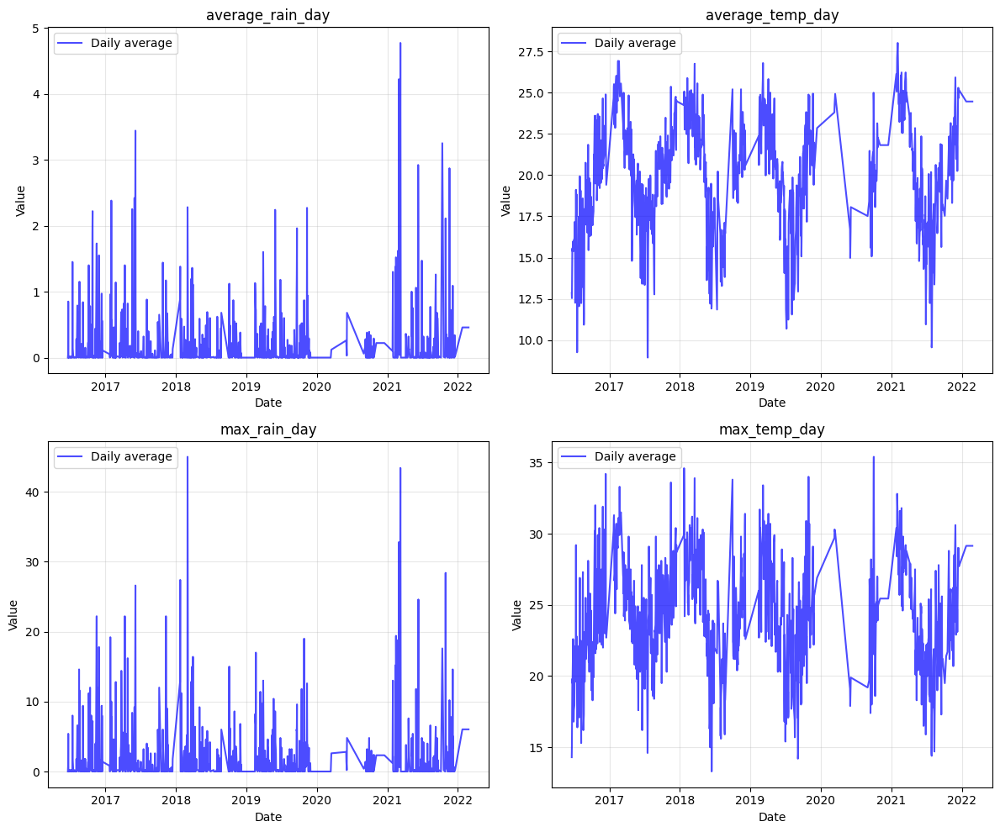

Summary statistics after filling:
       average_rain_day  average_temp_day  max_rain_day  max_temp_day
count      49593.000000      49593.000000  49593.000000  49593.000000
mean           0.195239         19.840879      1.974793     24.062691
std            0.449042          3.454692      4.435654      3.846538
min            0.000000          8.940000      0.000000     13.300000
25%            0.000000         17.530000      0.000000     21.500000
50%            0.010000         20.150000      0.200000     23.900000
75%            0.180000         22.400000      1.800000     26.700000
max            4.770000         28.010000     45.000000     35.400000


In [ ]:
visualize_gaps(cleared_from_null_df, date_col=date_col, weather_cols=weather_cols)

Пойдем дальше по признакам, требующим заполнения пропущенных значений

In [ ]:
analyze_missing_values_by_column(cleared_from_null_df)

        column  missing_count  missing_percent
0          age          10350        20.869881
9    specialty           7454        15.030347
10  disability           5146        10.376464


В стратегии заполнения возраста `age` используется иерархический подход:
 1) вычисляются медианные значения возраста для каждой медицинской специальности `specialty`, и для пациентов с пропущенным возрастом, у которых указана специальность, пропуски заполняются соответствующей медианой;
 2) для случаев, когда специальность неизвестна или не имеет достаточных данных, применяется алгоритм k-ближайших соседей (KNN), который на основе известных значений возраста у пациентов с аналогичными характеристиками (специальность, тип инвалидности `disability` и возрастная категория до 12 лет `under_12_years_old`) предсказывает пропущенные значения, причем используется взвешенный KNN-регрессор, где более близкие соседи имеют больший вес.

In [ ]:
def fill_age_with_specialty_median(df):
    df_filled = df.copy()
    specialty_medians = df_filled.groupby('specialty')['age'].median()
    nan_indices = df_filled.index[df_filled['age'].isnull()].tolist()
    filled_count = 0

    for idx in nan_indices:
        specialty = df_filled.at[idx, 'specialty']
        if specialty in specialty_medians and not pd.isna(specialty_medians[specialty]):
            df_filled.at[idx, 'age'] = specialty_medians[specialty]
            filled_count += 1

    print(f"Age filled by specialty median: {filled_count}")
    return df_filled

def fill_age_with_knn(df, k=5):
    df_filled = df.copy()
    features = ['specialty', 'disability', 'under_12_years_old']
    features = [f for f in features if f in df_filled.columns]
    known_data = df_filled[df_filled['age'].notnull()]
    unknown_data = df_filled[df_filled['age'].isnull()]
    if len(known_data) == 0 or len(unknown_data) == 0:
        return df_filled

    X_train = pd.get_dummies(known_data[features], drop_first=True)
    X_predict = pd.get_dummies(unknown_data[features], drop_first=True)
    X_train, X_predict = X_train.align(X_predict, join='left', axis=1, fill_value=0)
    X_predict = X_predict[X_train.columns]
    y_train = known_data['age']

    from sklearn.neighbors import KNeighborsRegressor
    knn = KNeighborsRegressor(n_neighbors=min(k, len(known_data)), weights='distance')
    knn.fit(X_train, y_train)
    predictions = knn.predict(X_predict)
    df_filled.loc[unknown_data.index, 'age'] = predictions

    print(f"Age KNN filled: {len(unknown_data)}")
    return df_filled

In [ ]:
# @title visualize_age_filling
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def visualize_age_filling(df_before, df_after):
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Age Distribution (Before)', 'Age Distribution (After)',
                        'Age Box Plot (Before)', 'Age Box Plot (After)')
    )

    age_before = df_before['age'].dropna()
    age_after = df_after['age']

    fig.add_trace(go.Histogram(x=age_before, nbinsx=30, name='Before'), row=1, col=1)
    fig.add_trace(go.Histogram(x=age_after, nbinsx=30, name='After'), row=1, col=2)

    fig.add_trace(go.Box(y=age_before, name='Before', showlegend=False), row=2, col=1)
    fig.add_trace(go.Box(y=age_after, name='After', showlegend=False), row=2, col=2)

    fig.update_xaxes(title_text='Age', row=1, col=1)
    fig.update_xaxes(title_text='Age', row=1, col=2)
    fig.update_yaxes(title_text='Frequency', row=1, col=1)
    fig.update_yaxes(title_text='Frequency', row=1, col=2)
    fig.update_yaxes(title_text='Age', row=2, col=1)
    fig.update_yaxes(title_text='Age', row=2, col=2)

    fig.update_layout(height=1500, showlegend=True)
    fig.show()

    print(f"Missing before: {df_before['age'].isnull().sum()}")
    print(f"Missing after: {df_after['age'].isnull().sum()}")

    stats = df_after['age'].agg(['mean', 'median', 'std', 'min', 'max'])
    print("\nAge statistics after filling:")
    print(f"  Mean: {stats['mean']:.2f}")
    print(f"  Median: {stats['median']:.2f}")
    print(f"  Std: {stats['std']:.2f}")
    print(f"  Min: {stats['min']:.2f}")
    print(f"  Max: {stats['max']:.2f}")

In [ ]:
if cleared_from_null_df['age'].isnull().any():
    df_before = cleared_from_null_df.copy()
    df_step1 = fill_age_with_specialty_median(cleared_from_null_df)
    df_final = fill_age_with_knn(df_step1)
    visualize_age_filling(df_before, df_final)
    cleared_from_null_df = df_final

Age filled by specialty median: 7416
Age KNN filled: 2934


Missing before: 10350
Missing after: 0

Age statistics after filling:
  Mean: 17.76
  Median: 11.00
  Std: 17.59
  Min: 2.00
  Max: 110.00


В стратегии заполнения специальности `specialty` используется алгоритм k-ближайших соседей (KNN):
1) в качестве признаков для определения похожести пациентов используются возраст `age`, тип инвалидности `disability` и возрастная категория до 12 лет `under_12_years_old`;
2) пропущенные значения в признаках заполняются медианными значениями из обучающей выборки.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

def fill_specialty_with_knn(df, k=7):
    nan_mask = df['specialty'].isnull()
    if not nan_mask.any():
        return df

    known_data = df[~nan_mask]
    unknown_mask = nan_mask.copy()

    features = ['age', 'disability', 'under_12_years_old']

    X_train = known_data[features].copy()
    X_predict = df.loc[unknown_mask, features].copy()

    for col in features:
        if X_train[col].dtype == 'object':
            all_vals = pd.concat([X_train[col], X_predict[col]]).dropna().unique()
            val_map = {v: i for i, v in enumerate(all_vals)}
            X_train[col] = X_train[col].map(val_map)
            X_predict[col] = X_predict[col].map(val_map)

        median_val = X_train[col].median()
        X_train[col] = X_train[col].fillna(median_val)
        X_predict[col] = X_predict[col].fillna(median_val)

    knn = KNeighborsClassifier(n_neighbors=k, weights='distance')
    knn.fit(X_train, known_data['specialty'])

    df.loc[unknown_mask, 'specialty'] = knn.predict(X_predict)
    return df

In [ ]:
# @title visualize_specialty_filling
import plotly.graph_objects as go

def visualize_specialty_filling(df_before, df_after):
    top_5_before = df_before['specialty'].value_counts().head(5)
    top_5_after = df_after['specialty'].value_counts().head(5)
    fig = go.Figure()

    fig.add_trace(go.Bar(x=top_5_before.index, y=top_5_before.values,
                         name='Before', marker_color='lightblue'))
    fig.add_trace(go.Bar(x=top_5_after.index, y=top_5_after.values,
                         name='After', marker_color='lightcoral'))
    fig.update_layout(
        title='Top 5 Specialties (Before vs After)',
        xaxis_title='Specialty',
        yaxis_title='Count',
        barmode='group',
        showlegend=True
    )

    fig.update_xaxes(tickangle=45)
    fig.show()

    print(f"Missing before: {df_before['specialty'].isnull().sum()}")
    print(f"Missing after: {df_after['specialty'].isnull().sum()}")

In [ ]:
if cleared_from_null_df['specialty'].isnull().any():
    original_disability = cleared_from_null_df['disability'].copy()
    df_before = cleared_from_null_df.copy()
    cleared_from_null_df = fill_specialty_with_knn(cleared_from_null_df)
    cleared_from_null_df['disability'] = original_disability.combine_first(cleared_from_null_df['disability'])
    visualize_specialty_filling(df_before, cleared_from_null_df)

Missing before: 7454
Missing after: 0


Сначала для каждой `specialty`, содержащей более 50 записей с известной `disability`, определяется доминирующая категория (`intellectual` или `motor`), но только если она составляет более 70% случаев в данной специальности.

Данные группируются по возрастным категориям (дети до 12 лет, подростки 12-18, молодые 18-30, средний возраст 30-50 и старше 50), и для каждой возрастной группы с более чем 100 записями также выявляется доминирующий тип инвалидности `disability`, если он превышает 65% случаев в группе.

В результате получаем два словаря: соответствия между специальностями и преобладающим типом `disability`, а также между возрастными группами и характерной для них `disability`, которые затем используются для более осознанного заполнения пропусков

In [ ]:
def analyze_disability_patterns(df):
    specialty_disability = {}
    for specialty in df['specialty'].dropna().unique():
        mask = (df['specialty'] == specialty) & (df['disability'].notnull())
        if mask.sum() > 50:
            disability_counts = df.loc[mask, 'disability'].value_counts(normalize=True)
            if disability_counts.max() > 0.7:
                specialty_disability[specialty] = disability_counts.idxmax()

    age_group_disability = {}
    df['age_group'] = pd.cut(df['age'], bins=[0, 12, 18, 30, 50, 100], labels=['child', 'teen', 'young', 'middle', 'senior'])
    for age_group in df['age_group'].dropna().unique():
        mask = (df['age_group'] == age_group) & (df['disability'].notnull())
        if mask.sum() > 100:
            disability_counts = df.loc[mask, 'disability'].value_counts(normalize=True)
            if disability_counts.max() > 0.65:
                age_group_disability[age_group] = disability_counts.idxmax()

    return specialty_disability, age_group_disability

def fill_disability_with_rules(df, specialty_rules, age_rules):
    df_filled = df.copy()
    rules_filled = 0
    nan_indices = df_filled.index[df_filled['disability'].isnull()].tolist()

    for idx in nan_indices:
        row = df_filled.loc[idx]
        if row['specialty'] in specialty_rules:
            df_filled.at[idx, 'disability'] = specialty_rules[row['specialty']]
            rules_filled += 1
            continue
        if 'age_group' in df_filled.columns and row['age_group'] in age_rules:
            df_filled.at[idx, 'disability'] = age_rules[row['age_group']]
            rules_filled += 1

    print(f"Disability rules filled: {rules_filled}")
    if 'age_group' in df_filled.columns:
        df_filled = df_filled.drop('age_group', axis=1)

    return df_filled

In [ ]:
# @title visualize_disability_filling
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def visualize_disability_filling(df_before, df_after):
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=('Disability Before Filling', 'Disability After Filling'),
        specs=[[{'type': 'domain'}, {'type': 'domain'}]]
    )

    before_counts = df_before['disability'].value_counts()
    after_counts = df_after['disability'].value_counts()

    fig.add_trace(go.Pie(labels=before_counts.index, values=before_counts.values, name='Before'),
                  row=1, col=1)
    fig.add_trace(go.Pie(labels=after_counts.index, values=after_counts.values, name='After'),
                  row=1, col=2)

    fig.update_layout(height=700, showlegend=True)
    fig.show()

    print(f"Missing before: {df_before['disability'].isnull().sum()}")
    print(f"Missing after: {df_after['disability'].isnull().sum()}")

In [ ]:
if cleared_from_null_df['disability'].isnull().any():
    df_before = cleared_from_null_df.copy()
    specialty_rules, age_rules = analyze_disability_patterns(cleared_from_null_df)
    df_final = fill_disability_with_rules(cleared_from_null_df, specialty_rules, age_rules)
    visualize_disability_filling(df_before, df_final)
    cleared_from_null_df = df_final

Disability rules filled: 5146


Missing before: 5146
Missing after: 0


Кажется, с пропусками - ВСË!

In [ ]:
analyze_missing_values_by_column(cleared_from_null_df)

'No more missing values!'

### Outliers

Цель: выявить и охарактеризовать выбросы в числовых переменных, используя методы межквартильного размаха (IQR) и Z-score. Выбрать и обосновать подходящую стратегию обработки выбросов (удаление, замену на граничные значения или преобразование данных) и реализовать её для сохранения информативности признаков при минимизации искажающего влияния экстремальных значений.

In [ ]:
from scipy import stats
from prettytable import PrettyTable

def detect_and_handle_outliers(df, iqr_cols, zscore_cols, iqr_multiplier=1.5, z_threshold=3):
    df_processed = df.copy()
    all_cols = iqr_cols + zscore_cols
    table = PrettyTable()
    table.field_names = ["Variable", "Method", "Outliers", "Percentage"]

    for col in all_cols:
        data = df[col].dropna()

        if col in iqr_cols:
            Q1 = data.quantile(0.25)
            Q3 = data.quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - iqr_multiplier * IQR
            upper_bound = Q3 + iqr_multiplier * IQR
            outliers_mask = (df[col] < lower_bound) | (df[col] > upper_bound)
            method = "IQR"
            df_processed.loc[outliers_mask & (df[col] < lower_bound), col] = lower_bound
            df_processed.loc[outliers_mask & (df[col] > upper_bound), col] = upper_bound
        else:
            z_scores = np.abs(stats.zscore(data))
            outliers_mask = pd.Series(False, index=df.index)
            outliers_mask.loc[data.index] = z_scores > z_threshold
            method = "Z-score"

        outliers_count = outliers_mask.sum()
        outliers_percent = (outliers_count / len(df)) * 100
        table.add_row([col, method, outliers_count, f"{outliers_percent:.2f}%"])

        if col in zscore_cols and outliers_mask.any():
            df_processed = df_processed[~outliers_mask]

    print(table)
    return df_processed.reset_index(drop=True)

def visualize_outliers_comparison(df_before, df_after, iqr_cols, zscore_cols):
    all_cols = iqr_cols + zscore_cols
    for col in all_cols:
        fig = make_subplots(rows=1, cols=3, subplot_titles=[f'{col} - before', f'{col} - distribution', f'{col} - after'])
        fig.add_trace(go.Box(y=df_before[col].dropna(), name='before'), row=1, col=1)
        fig.add_trace(go.Histogram(x=df_before[col].dropna(), nbinsx=50), row=1, col=2)
        fig.add_trace(go.Box(y=df_after[col].dropna(), name='after'), row=1, col=3)
        fig.update_layout(showlegend=False)
        fig.show()

In [ ]:
outliers_free_df = cleared_from_null_df.copy()
print("Numeric features in use:", numeric_cols)

Numeric features in use: ['age', 'average_temp_day', 'average_rain_day', 'max_temp_day', 'max_rain_day']


Метод межквартильного размаха (IQR) для признаков `age`, `average_rain_day` и `max_rain_day работает` путем вычисления границ, основанных на статистиках распределения:
1) был выбран, так как IQR устойчив к ненормальному распределению данных и особенно подходит для переменных, демонстрирующих асимметрию;
2) после идентификации выбросов стратегия обработки включает замену значений за нижней границей IQR на саму границу, значений за верхней границей IQR на верхнюю границу.

Метод Z-score для переменных `average_temp_day` и `max_temp_day` использует стандартное отклонение от среднего значения, где любые наблюдения, превышающие три стандартных отклонения, считаются выбросами;
1) был выбран, так как оптимален для данных, приближенных к нормальному распределению (у нас это как раз температурные показатели).
2)  после идентификации выбросов стратегия обработки удаляет их (ввиду незначительности доли выбросов).

In [ ]:
from scipy import stats
from prettytable import PrettyTable

def detect_outliers(df, col, iqr_multiplier=1.5, z_threshold=3):
    data = df[col].dropna()

    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_iqr = Q1 - iqr_multiplier * IQR
    upper_iqr = Q3 + iqr_multiplier * IQR
    outliers_iqr = (df[col] < lower_iqr) | (df[col] > upper_iqr)

    z_scores = np.abs(stats.zscore(data))
    outliers_z = pd.Series(False, index=df.index)
    outliers_z.loc[data.index] = z_scores > z_threshold

    intersection = (outliers_iqr & outliers_z).sum()
    union = (outliers_iqr | outliers_z).sum()
    jaccard = intersection / union if union > 0 else 0

    return {
        'outliers_iqr': outliers_iqr,
        'outliers_z': outliers_z,
        'lower_iqr': lower_iqr,
        'upper_iqr': upper_iqr,
        'jaccard': jaccard,
        'intersection': intersection
    }

def apply_strategy(df, col, col_type, detection_results):
    outliers_iqr = detection_results['outliers_iqr']
    outliers_z = detection_results['outliers_z']
    lower_iqr = detection_results['lower_iqr']
    upper_iqr = detection_results['upper_iqr']
    jaccard = detection_results['jaccard']

    if col_type == 'iqr':
        if jaccard > 0.3:
            outliers_mask = outliers_iqr
            strategy = "IQR-capped"
        else:
            outliers_mask = outliers_iqr & outliers_z
            strategy = "Intersection-capped"

        df.loc[outliers_mask & (df[col] < lower_iqr), col] = lower_iqr
        df.loc[outliers_mask & (df[col] > upper_iqr), col] = upper_iqr

    else:
        if jaccard > 0.4:
            outliers_mask = outliers_z
            strategy = "Z-score-removed"
        else:
            outliers_mask = outliers_iqr & outliers_z
            strategy = "Intersection-removed"

    return df, outliers_mask, strategy

In [ ]:
# @title visualize_outliers_analysis
def visualize_outliers_analysis(df, iqr_cols, zscore_cols):
    for col in iqr_cols + zscore_cols:
        detection_results = detect_outliers(df, col)
        outliers_iqr = detection_results['outliers_iqr']
        outliers_z = detection_results['outliers_z']

        data = df[col].dropna()

        fig = make_subplots(
            rows=2, cols=2,
            subplot_titles=[
                f'{col} - Data with IQR Boundaries',
                f'{col} - Z-score Distribution',
                f'{col} - Method Comparison',
                f'{col} - Combined Outliers'
            ]
        )

        fig.add_trace(go.Scatter(x=data.index, y=data, mode='markers', name='Data'), row=1, col=1)
        fig.add_hline(y=detection_results['lower_iqr'], line_dash="dash", line_color="red", row=1, col=1, name='Lower IQR')
        fig.add_hline(y=detection_results['upper_iqr'], line_dash="dash", line_color="red", row=1, col=1, name='Upper IQR')
        fig.update_xaxes(title_text="Index", row=1, col=1)
        fig.update_yaxes(title_text=f"{col} Value", row=1, col=1)

        z_scores = np.abs(stats.zscore(data))
        fig.add_trace(go.Histogram(x=z_scores, nbinsx=30, name='Z-scores'), row=1, col=2)
        fig.add_vline(x=3, line_dash="dash", line_color="red", row=1, col=2, name='Z=3 threshold')
        fig.update_xaxes(title_text="Z-score", row=1, col=2)
        fig.update_yaxes(title_text="Frequency", row=1, col=2)

        labels = ['IQR only', 'Z-score only', 'Both', 'Neither']
        values = [
            (outliers_iqr.loc[data.index] & ~outliers_z.loc[data.index]).sum(),
            (~outliers_iqr.loc[data.index] & outliers_z.loc[data.index]).sum(),
            (outliers_iqr.loc[data.index] & outliers_z.loc[data.index]).sum(),
            (~outliers_iqr.loc[data.index] & ~outliers_z.loc[data.index]).sum()
        ]

        fig.add_trace(go.Bar(x=labels, y=values, name='Count'), row=2, col=1)
        fig.update_xaxes(title_text="Outlier Detection Method", row=2, col=1)
        fig.update_yaxes(title_text="Number of Points", row=2, col=1)

        colors = []
        for i in range(len(data)):
            idx = data.index[i]
            if not (outliers_iqr[idx] or outliers_z[idx]):
                colors.append('green')
            elif outliers_iqr[idx] != outliers_z[idx]:
                colors.append('orange')
            else:
                colors.append('red')

        fig.add_trace(go.Scatter(x=data.index, y=data, mode='markers', marker=dict(color=colors), name='Outlier Status'), row=2, col=2)
        fig.update_xaxes(title_text="Index", row=2, col=2)
        fig.update_yaxes(title_text=f"{col} Value", row=2, col=2)

        fig.update_layout(
            height=800,
            title_text=f"Outlier Analysis: {col}",
            showlegend=True
        )
        fig.show()

In [ ]:
iqr_cols = ["age", "average_rain_day", "max_rain_day"]
zscore_cols = ["average_temp_day", "max_temp_day"]

outliers_free_df_before = outliers_free_df.copy()
visualize_outliers_analysis(outliers_free_df, iqr_cols, zscore_cols)

In [ ]:
def analyze_and_handle_outliers(df, iqr_cols, zscore_cols, iqr_multiplier=1.5, z_threshold=3):
    df_processed = df.copy()
    table = PrettyTable()
    table.field_names = ["Variable", "IQR", "Z-score", "Intersection", "Jaccard", "Strategy"]

    total_outliers_mask = pd.Series(False, index=df.index)
    results = {}

    for col in iqr_cols + zscore_cols:
        detection_results = detect_outliers(df, col, iqr_multiplier, z_threshold)
        results[col] = detection_results

        col_type = 'iqr' if col in iqr_cols else 'zscore'
        df_processed, outliers_mask, strategy = apply_strategy(df_processed, col, col_type, detection_results)

        if col_type == 'zscore':
            total_outliers_mask = total_outliers_mask | outliers_mask

        table.add_row([
            col,
            detection_results['outliers_iqr'].sum(),
            detection_results['outliers_z'].sum(),
            detection_results['intersection'],
            f"{detection_results['jaccard']:.3f}",
            strategy
        ])

    if total_outliers_mask.any():
        df_processed = df_processed[~total_outliers_mask].reset_index(drop=True)

    print("Outlier Analysis and Handling:")
    print(table)
    print(f"\nRows removed: {total_outliers_mask.sum()}")
    print(f"Final size: {len(df_processed)} rows")

    return df_processed, results

In [ ]:
outliers_free_df, analysis_results = analyze_and_handle_outliers(
    outliers_free_df,
    iqr_cols=iqr_cols,
    zscore_cols=zscore_cols
)

Outlier Analysis and Handling:
+------------------+------+---------+--------------+---------+----------------------+
|     Variable     | IQR  | Z-score | Intersection | Jaccard |       Strategy       |
+------------------+------+---------+--------------+---------+----------------------+
|       age        | 7095 |   1094  |     1094     |  0.154  | Intersection-capped  |
| average_rain_day | 7212 |   1300  |     1300     |  0.180  | Intersection-capped  |
|   max_rain_day   | 6546 |   1196  |     1196     |  0.183  | Intersection-capped  |
| average_temp_day | 318  |   231   |     231      |  0.726  |   Z-score-removed    |
|   max_temp_day   | 153  |    0    |      0       |  0.000  | Intersection-removed |
+------------------+------+---------+--------------+---------+----------------------+

Rows removed: 231
Final size: 49362 rows


In [ ]:
df = outliers_free_df

### Transformation

1. age

**Преобразование не требуется**  
Почему?   
Хотя распределение возраста асимметрично, возраст — это переменная с естественной интерпретацией, и, как я полагаю, его шкала имеет определённый внутренний смысл. Применение логарифмического или степенного преобразования безосновательно разрушит этот смысл.

2. average_temp_day

**Преобразование не требуется**  
Почему?  
Распределение выглядит как близкое к нормальному, нет тяжёлого скоса или хвоста, которые бы оправдывали применение преобразования

3. max_temp_day

**Преобразование не требуется**  
Почему?  
Распределение близко к нормальному, и значения имеют физический смысл в своём исходном виде. Полагаю, преобразования не улучшат производительность модели.



4. average_rain_day

**Требуется преобразование**   
Почему?   
Этот признак демонстрирует сильную правостороннюю асимметрию, большое скопление нулей и длинный положительный хвост. Такие распределения нарушают предположения линейных моделей  

Кажется, логарифмическое преобразование является стандартной практикой в метеорологии для анализа, можно попробовать. Преобразованное значение интерпретируется не как "миллиметры дождя", а скорее как нормализованное представление интенсивности

5. max_rain_day

**Требуется преобразование!**  
Почему?  
Этот признак имеет те же характеристики распределения, что и average_rain_day — большой всплеск на нуле и длинный хвост. Применяются те же правила

Бинарные переменные не требуют никакого преобразования. Это включает такие признаки, как индикаторы шторма и другие погодные признаки. Их дисбаланс в значениях не является статистической проблемой

Давайте реализуем кастомное преобразование на основе log1p, которое обрабатывает нули, очень малые значения и отрицательные значения

In [ ]:
def safe_log_transform(x):
    x = x.copy()
    min_positive = x[x > 0].min()

    if pd.isna(min_positive):
        return x * 0

    # shift negatives
    shift = 0
    if (x < 0).any():
        shift = abs(x.min()) + 1e-6

    return np.log1p(x + shift)


Имплементация с нуля Yeo-Johnson преобразования, на вход передаём lambda

In [ ]:
def yeo_johnson_transform(x, lamb):
    x = x.copy()
    y = np.zeros_like(x, dtype=float)

    pos = x >= 0
    neg = ~pos

    # Positive part
    if lamb != 0:
        y[pos] = ((x[pos] + 1)**lamb - 1) / lamb
    else:
        y[pos] = np.log1p(x[pos])

    # Negative part
    if lamb != 2:
        y[neg] = -(((-x[neg] + 1)**(2 - lamb) - 1) / (2 - lamb))
    else:
        y[neg] = -np.log1p(-x[neg])

    return pd.Series(y, index=x.index)

Найдем лучшее значение лямбда, чтобы справиться с асимметрией



In [ ]:
def optimal_yeo_johnson_lambda(x, lambdas=None):
    if lambdas is None:
        lambdas = np.linspace(-50, 50, 501)

    best_lambda = None
    best_skew = np.inf
    best_transformed = None

    for l in lambdas:
        t = yeo_johnson_transform(x, l)
        s = t.skew()
        if abs(s) < best_skew:
            best_skew = abs(s)
            best_lambda = l
            best_transformed = t

    return best_lambda, best_transformed

In [ ]:
def compare_transformations(df, col):
    original = df[col]

    # Safe log
    t_log = safe_log_transform(original)

    # Yeo-Johnson с подбором λ вручную
    opt_lambda, t_yj_opt = optimal_yeo_johnson_lambda(original.fillna(0))

    print(f"Feature: {col}")
    print(f"Original skewness: {original.skew():.3f}")
    print(f"SafeLog skewness: {t_log.skew():.3f}")
    print(f"Yeo-Johnson optimal λ={opt_lambda:.3f} skewness: {t_yj_opt.skew():.3f}")

    return pd.DataFrame({
        "original": original,
        "log": t_log,
        "yj_opt": t_yj_opt
    }), opt_lambda

In [ ]:
rain_cols = ["average_rain_day", "max_rain_day"]
df_transform = df.copy()
for c in rain_cols:
    df_transform[c] = pd.to_numeric(df_transform[c], errors="coerce")

rain_transformed = {}
optimal_lambdas = {}

for col in rain_cols:
    transformed_df, opt_lambda = compare_transformations(df_transform, col)
    rain_transformed[col] = transformed_df
    optimal_lambdas[col] = opt_lambda

print("Optimal lambdas for Yeo-Johnson:")
print(optimal_lambdas)

Feature: average_rain_day
Original skewness: 2.412
SafeLog skewness: 1.894
Yeo-Johnson optimal λ=-50.000 skewness: 0.026
Feature: max_rain_day
Original skewness: 2.439
SafeLog skewness: 1.199
Yeo-Johnson optimal λ=-3.600 skewness: -0.012
Optimal lambdas for Yeo-Johnson:
{'average_rain_day': np.float64(-50.0), 'max_rain_day': np.float64(-3.5999999999999943)}


Судя по тому, что у average_rain_day так сильно уводится первый признак в -50, признак мультимодальный и мы пытаемся два (или больше) пика свести к одному, что принципиально неправильно. Проверим это

In [ ]:
def is_bimodal_kde(x, bandwidth='scott', peak_prominence=0.01):
    x = x[~np.isnan(x)].reshape(-1, 1)

    if bandwidth == "scott":
        bandwidth = np.std(x) * (len(x) ** (-1/5))
    kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(x)

    grid = np.linspace(np.min(x), np.max(x), 2000).reshape(-1, 1)
    log_dens = kde.score_samples(grid)
    dens = np.exp(log_dens)

    peaks, _ = find_peaks(dens, prominence=peak_prominence)

    return len(peaks) >= 2, peaks, grid, dens

In [ ]:
is_bi, peaks, grid, dens = is_bimodal_kde(df["average_rain_day"].values)
print("Bimodal:", is_bi)

Bimodal: True


In [ ]:
is_bi, peaks, grid, dens = is_bimodal_kde(df["max_rain_day"].values)
print("Bimodal:", is_bi)

Bimodal: True


Значит, подход неверный и нам надо не стремиться к нормальности, а просто сделать эти значения более удобными для модели. Кажется, лучшей тактикой будет применить log transform и сделать feature engineering к данным. Видимо, дело в том, что в нашем случае осадки часто  делятся на категории: нет дождя, слабый, умеренный, сильный. У нас уже есть такой категориальный признак, поэтому мы не делаем его, а вот для логистической регрессии будет полезно сделать численное выражение rain_intensity_value - разница между максимальным и средним значением

In [ ]:
def process_rain_features(df, rain_cols):
    df[rain_cols] = df[rain_cols].apply(
        lambda col: pd.to_numeric(col, errors="coerce")
    )

    for col in rain_cols:
        p95 = df[col].quantile(0.95)
        df[col] = np.where(df[col] > p95, p95, df[col])

    df["average_rain_day"] = safe_log_transform(df["average_rain_day"])
    df["max_rain_day"] = safe_log_transform(df["max_rain_day"])

    # Интенсивность дождя
    df["rain_intensity_value"] = df["max_rain_day"] - df["average_rain_day"]

In [ ]:
process_rain_features(df, rain_cols)

###Scaling

Мы используем скалирование, так как планируем делать logreg. Преимущества в том, что делаем данные с нулевым средним и дисперсией 1, что идеально подходит для линейных моделей. К выбросам такой подход более устойчив, чем min-max. Мы ещё попробуем деревья, но там вообще ничего не нужно

In [ ]:
numeric_cols = ["age", "average_temp_day", "max_temp_day", "max_rain_day", "average_rain_day"]

means = df[numeric_cols].mean()
stds = df[numeric_cols].std(ddof=0)

df_scaled = df.copy()

# применяем формулу (x - mean) / std
df_scaled[numeric_cols] = (df_scaled[numeric_cols] - means) / stds


In [ ]:
df_scaled[numeric_cols]

,age,average_temp_day,max_temp_day,max_rain_day,average_rain_day
0,-0.643556,-2.075604,-2.567445,-0.785641,-0.643809
1,2.993413,-2.075604,-2.567445,-0.785641,-0.643809
2,-0.239448,-2.075604,-2.567445,-0.785641,-0.643809
3,-0.576204,-2.075604,-2.567445,-0.785641,-0.643809
4,0.669794,-2.075604,-2.567445,-0.785641,-0.643809
...,...,...,...,...,...
49357,-0.172097,1.350227,1.322540,1.940359,1.582953
49358,3.464872,1.350227,1.322540,1.940359,1.582953
49359,-0.441502,1.350227,1.322540,1.940359,1.582953
49360,-0.172097,1.350227,1.322540,1.940359,1.582953


### Data noise reduction

In [ ]:
# исправление ошибок в числовых признаках

import warnings
warnings.filterwarnings('ignore')

from scipy import stats

numeric_features = ["age", "average_temp_day", "average_rain_day",
                    "max_temp_day", "max_rain_day"]

for col in numeric_features:
    if col not in df.columns:
        continue

    print(f"\n{col}:")
    corrections = 0

    if col == "age":
        # возраст не может быть отрицательным
        negative = (df[col] < 0).sum()
        if negative > 0:
            print(f"  Отрицательные значения: {negative}")
            df.loc[df[col] < 0, col] = np.nan
            corrections += negative

        # возраст не может быть больше 100
        too_old = (df[col] > 100).sum()
        if too_old > 0:
            print(f"  Значения > 100: {too_old}")
            df.loc[df[col] > 100, col] = np.nan
            corrections += too_old

        # обрезка экстремальных выбросов
        q01, q99 = df[col].quantile([0.01, 0.99])
        extreme = ((df[col] < q01) | (df[col] > q99)).sum()
        if extreme > 0:
            print(f"  Экстремальные значения: {extreme}")
            df[col] = df[col].clip(q01, q99)
            corrections += extreme


    if corrections > 0:
        print(f"  Всего исправлений: {corrections}")
    else:
        print(f"  Аномалий не обнаружено")



age:
  Экстремальные значения: 485
  Всего исправлений: 485

average_temp_day:
  Аномалий не обнаружено

average_rain_day:
  Аномалий не обнаружено

max_temp_day:
  Аномалий не обнаружено

max_rain_day:
  Аномалий не обнаружено


In [ ]:
df

,age,average_temp_day,average_rain_day,max_temp_day,max_rain_day,under_12_years_old,patient_needs_companion,rainy_day_before,storm_day_before,specialty,disability,appointment_month,rain_intensity,heat_intensity,appointment_shift,gender,appointment_date,no_show,rain_intensity_value
0,7.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
1,61.0,12.870000,0.000000,14.300000,0.000000,0,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
2,13.0,12.870000,0.000000,14.300000,0.000000,0,0,1,1,speech therapy,intellectual,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
3,8.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,intellectual,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
4,26.5,12.870000,0.000000,14.300000,0.000000,0,1,1,1,speech therapy,motor,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49357,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,F,2022-02-25,no,1.573183
49358,68.0,24.458911,0.376566,29.147387,1.949749,0,1,0,0,speech therapy,motor,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49359,10.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,speech therapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49360,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49362 entries, 0 to 49361
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   age                      49362 non-null  float64       
 1   average_temp_day         49362 non-null  float64       
 2   average_rain_day         49362 non-null  float64       
 3   max_temp_day             49362 non-null  float64       
 4   max_rain_day             49362 non-null  float64       
 5   under_12_years_old       49362 non-null  int64         
 6   patient_needs_companion  49362 non-null  int64         
 7   rainy_day_before         49362 non-null  int64         
 8   storm_day_before         49362 non-null  int64         
 9   specialty                49362 non-null  object        
 10  disability               49362 non-null  object        
 11  appointment_month        49362 non-null  object        
 12  rain_intensity           49362 n

In [ ]:
df['specialty'] = (
    df['specialty']
    .astype(str)
    .str.lower()
    .str.strip()
)

In [ ]:
# проверка логической согласованности

if "age" in df.columns and "under_12_years_old" in df.columns:
    print("\nпроверка: age vs under_12_years_old")

    # несоответствие 1: under_12_years_old=1, но age >= 12
    inconsistent1 = ((df["under_12_years_old"] == 1) & (df["age"] >= 12)).sum()
    if inconsistent1 > 0:
        print(f"  Несоответствие: under_12_years_old=1, но age >= 12: {inconsistent1}")
        df.loc[(df["under_12_years_old"] == 1) & (df["age"] >= 12), "under_12_years_old"] = 0
        print(f"  Исправлено")

    # несоответствие 2: age < 12, но under_12_years_old=0
    inconsistent2 = ((df["age"] < 12) & (df["under_12_years_old"] == 0)).sum()
    if inconsistent2 > 0:
        print(f"  Несоответствие: age < 12, но under_12_years_old=0: {inconsistent2}")
        df.loc[(df["age"] < 12) & (df["under_12_years_old"] == 0), "under_12_years_old"] = 1
        print(f"  Исправлено")

    if inconsistent1 == 0 and inconsistent2 == 0:
        print(f"  Логическая согласованность соблюдена")


проверка: age vs under_12_years_old
  Несоответствие: under_12_years_old=1, но age >= 12: 2168
  Исправлено
  Несоответствие: age < 12, но under_12_years_old=0: 4870
  Исправлено


In [ ]:
# проверка для over_60_years_old
if "age" in df.columns and "over_60_years_old" in df.columns:
    print("\nпроверка: age vs over_60_years_old")

    # несоответствие 1: over_60_years_old=1, но age <= 60
    inconsistent1 = ((df["over_60_years_old"] == 1) & (df["age"] <= 60)).sum()
    if inconsistent1 > 0:
        print(f"  Несоответствие: over_60_years_old=1, но age <= 60: {inconsistent1}")
        df.loc[(df["over_60_years_old"] == 1) & (df["age"] <= 60), "over_60_years_old"] = 0
        print(f"  Исправлено")

    # несоответствие 2: age > 60, но over_60_years_old=0
    inconsistent2 = ((df["age"] > 60) & (df["over_60_years_old"] == 0)).sum()
    if inconsistent2 > 0:
        print(f"  Несоответствие: age > 60, но over_60_years_old=0: {inconsistent2}")
        df.loc[(df["age"] > 60) & (df["over_60_years_old"] == 0), "over_60_years_old"] = 1
        print(f"  Исправлено")

    if inconsistent1 == 0 and inconsistent2 == 0:
        print(f"  Логическая согласованность соблюдена")

In [ ]:
df

,age,average_temp_day,average_rain_day,max_temp_day,max_rain_day,under_12_years_old,patient_needs_companion,rainy_day_before,storm_day_before,specialty,disability,appointment_month,rain_intensity,heat_intensity,appointment_shift,gender,appointment_date,no_show,rain_intensity_value
0,7.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
1,61.0,12.870000,0.000000,14.300000,0.000000,0,1,1,1,physiotherapy,motor,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
2,13.0,12.870000,0.000000,14.300000,0.000000,0,0,1,1,speech therapy,intellectual,june,no_rain,heavy_cold,afternoon,M,2016-06-20,no,0.000000
3,8.0,12.870000,0.000000,14.300000,0.000000,1,1,1,1,physiotherapy,intellectual,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
4,26.5,12.870000,0.000000,14.300000,0.000000,0,1,1,1,speech therapy,motor,june,no_rain,heavy_cold,afternoon,F,2016-06-20,no,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49357,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,F,2022-02-25,no,1.573183
49358,68.0,24.458911,0.376566,29.147387,1.949749,0,1,0,0,speech therapy,motor,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49359,10.0,24.458911,0.376566,29.147387,1.949749,1,0,0,0,speech therapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183
49360,14.0,24.458911,0.376566,29.147387,1.949749,0,0,0,0,physiotherapy,intellectual,feb,no_rain,heavy_cold,afternoon,M,2022-02-25,no,1.573183


In [ ]:
initial_rows = len(df)
duplicates = df.duplicated().sum()

print(f"Исходное количество строк: {initial_rows}")
print(f"Полные дубликаты: {duplicates}")

if duplicates > 0:
    df = df.drop_duplicates()
    print(f"Удалено дубликатов: {duplicates}")
    print(f"Финальное количество строк: {len(df)}")
else:
    print("Дубликатов не обнаружено")

Исходное количество строк: 49362
Полные дубликаты: 15159
Удалено дубликатов: 15159
Финальное количество строк: 34203


### Preprocessing (Type enforcing and one-hot encoding)

In [ ]:
binary_cols = [
    "under_12_years_old", "rainy_day_before",
    "storm_day_before", "patient_needs_companion"
]

for c in binary_cols:
    df[c] = df[c].astype(bool)


In [ ]:
categorical_cols = [
    "specialty",
    "disability",
    "appointment_month",
    "rain_intensity",
    "heat_intensity",
    "appointment_shift",
    "gender"
]
for c in categorical_cols:
    df[c] = df[c].astype("string").astype("category")


In [ ]:
numeric_cols = ["age", "average_temp_day", "max_temp_day", "max_rain_day", "average_rain_day"]

for c in numeric_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce").astype(float)


In [ ]:
cols_to_ohe = categorical_cols
df_before = df.columns
df = pd.get_dummies(df, columns=cols_to_ohe, drop_first=False)
added_ohe = [c for c in df.columns if c not in df_before]


In [ ]:
df

,age,average_temp_day,average_rain_day,max_temp_day,max_rain_day,under_12_years_old,patient_needs_companion,rainy_day_before,storm_day_before,appointment_date,...,heat_intensity_cold,heat_intensity_heavy_cold,heat_intensity_heavy_warm,heat_intensity_mild,heat_intensity_warm,appointment_shift_afternoon,appointment_shift_morning,gender_F,gender_I,gender_M
0,7.0,12.870000,0.000000,14.300000,0.000000,True,True,True,True,2016-06-20,...,False,True,False,False,False,True,False,False,False,True
1,61.0,12.870000,0.000000,14.300000,0.000000,False,True,True,True,2016-06-20,...,False,True,False,False,False,True,False,False,False,True
2,13.0,12.870000,0.000000,14.300000,0.000000,False,False,True,True,2016-06-20,...,False,True,False,False,False,True,False,False,False,True
3,8.0,12.870000,0.000000,14.300000,0.000000,True,True,True,True,2016-06-20,...,False,True,False,False,False,True,False,True,False,False
4,26.5,12.870000,0.000000,14.300000,0.000000,False,True,True,True,2016-06-20,...,False,True,False,False,False,True,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49342,10.0,24.458911,0.376566,29.147387,1.949749,True,False,False,False,2022-02-25,...,False,True,False,False,False,True,False,False,False,True
49351,15.0,24.458911,0.376566,29.147387,1.949749,False,False,False,False,2022-02-25,...,False,True,False,False,False,True,False,False,False,True
49353,17.6,24.458911,0.376566,29.147387,1.949749,False,False,False,False,2022-02-25,...,False,True,False,False,False,True,False,False,False,True
49355,10.0,24.458911,0.376566,29.147387,1.949749,True,True,False,False,2022-02-25,...,False,True,False,False,False,True,False,False,False,True


### Продвинутые методы многомерного анализа

#### PCA

In [ ]:
target_class = "no_show"

numeric_cols = df.select_dtypes(include=["int64", "float64", "bool"]).columns

numeric_cols = [c for c in numeric_cols if c != target_class]

X_num = df[numeric_cols]

In [ ]:
pca = PCA(n_components=min(10, X_num.shape[1]))
X_pca = pca.fit_transform(X_num)

explained = pca.explained_variance_ratio_
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=X_num.columns
)

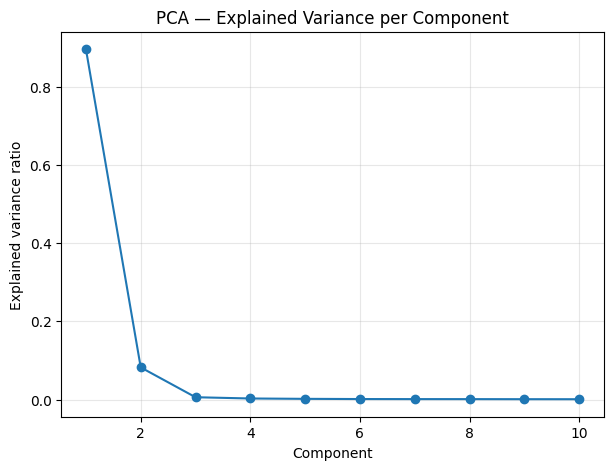

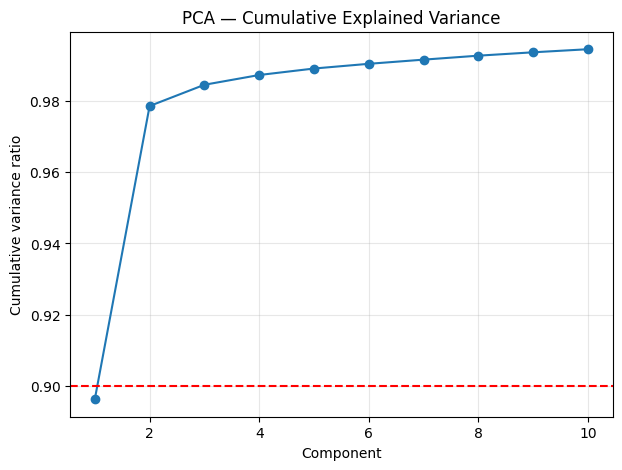

In [ ]:
plt.figure(figsize=(7, 5))
plt.plot(range(1, len(explained) + 1), explained, marker='o')
plt.title("PCA — Explained Variance per Component")
plt.xlabel("Component")
plt.ylabel("Explained variance ratio")
plt.grid(alpha=0.3)
plt.show()

plt.figure(figsize=(7, 5))
plt.plot(range(1, len(explained) + 1), explained.cumsum(), marker='o')
plt.title("PCA — Cumulative Explained Variance")
plt.xlabel("Component")
plt.ylabel("Cumulative variance ratio")
plt.axhline(0.9, color="red", linestyle="--")  # уровень 90%
plt.grid(alpha=0.3)
plt.show()

In [ ]:
for i in range(pca.n_components_):
    print(f"\nTop contributors to PC{i+1}")
    display(
        loadings.iloc[:, i]
        .abs()
        .sort_values(ascending=False)
        .head(3)
    )


Top contributors to PC1


,PC1
age,0.999439
under_12_years_old,0.017573
disability_intellectual,0.017055



Top contributors to PC2


,PC2
max_temp_day,0.750101
average_temp_day,0.653962
heat_intensity_cold,0.065196



Top contributors to PC3


,PC3
average_temp_day,0.647858
max_temp_day,0.576267
max_rain_day,0.328876



Top contributors to PC4


,PC4
max_rain_day,0.588431
rain_intensity_value,0.462015
average_temp_day,0.371308



Top contributors to PC5


,PC5
appointment_shift_afternoon,0.536339
appointment_shift_morning,0.536339
disability_motor,0.309571



Top contributors to PC6


,PC6
gender_M,0.541823
gender_F,0.541726
appointment_shift_afternoon,0.389660



Top contributors to PC7


,PC7
heat_intensity_mild,0.784527
heat_intensity_cold,0.416975
heat_intensity_warm,0.353919



Top contributors to PC8


,PC8
patient_needs_companion,0.730021
under_12_years_old,0.540722
specialty_psychotherapy,0.223378



Top contributors to PC9


,PC9
specialty_psychotherapy,0.449123
specialty_physiotherapy,0.420647
disability_motor,0.385308



Top contributors to PC10


,PC10
specialty_speech therapy,0.756263
specialty_psychotherapy,0.504741
specialty_physiotherapy,0.236149


In [ ]:
n_keep = np.argmax(explained.cumsum() >= 0.95) + 1
print("Using PCA components:", n_keep)

pca_cols = [f"PCA_{i+1}" for i in range(n_keep)]
df_pca_numeric = pd.DataFrame(X_pca[:, :n_keep], columns=pca_cols, index=df.index)

non_numeric_cols = df.columns.difference(numeric_cols)

df_reduced = pd.concat([df_pca_numeric, df[non_numeric_cols]], axis=1)

df_reduced.head()

Using PCA components: 2


,PCA_1,PCA_2,appointment_date,no_show
0,-11.147034,-11.742321,2016-06-20,no
1,42.840257,-12.128357,2016-06-20,no
2,-5.170485,-11.782835,2016-06-20,no
3,-10.175766,-11.750998,2016-06-20,no
4,8.357403,-11.882724,2016-06-20,no


#### t-SNE

In [ ]:
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols_for_tsne = [c for c in numeric_cols if c != "no_show"]

X_num = df[numeric_cols_for_tsne].fillna(0)
y = df["no_show"]


In [ ]:
tsne_2d = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate=200,
    n_iter=1500,
    random_state=42
)


In [ ]:
X_tsne_2d = tsne_2d.fit_transform(X_num)

KeyboardInterrupt: 

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=X_tsne_2d[:, 0],
    y=X_tsne_2d[:, 1],
    hue=y,
    palette="coolwarm",
    s=30,
    alpha=0.7
)
plt.title("t-SNE 2D projection")
plt.xlabel("TSNE-1")
plt.ylabel("TSNE-2")
plt.legend(title="no_show")
plt.grid(True, alpha=0.2)
plt.show()

Генерация взаимодействий признаков
Биннинг и дискретизация

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime

df_new = df.copy()


# Извлекаем день недели (0=понедельник, 6=воскресенье)
df_new['day_of_week'] = df_new['appointment_date'].dt.dayofweek

#  выходные
df_new['is_weekend'] = df_new['day_of_week'].isin([5, 6]).astype(int)


# категории возраста
df_new['age_group'] = pd.cut(df_new['age'],
    bins=[0, 12, 18, 30, 45, 60, 75, 100],
    labels=['child', 'teen', 'young', 'adult', 'middle', 'senior', 'elderly'])


# Плохая погода для посещения
df_new['bad_weather'] = (
    (df_new['rain_intensity_heavy'] == 1) |
    (df_new['storm_day_before'] == 1) |
    (df_new['heat_intensity_heavy_cold'] == 1) |
    (df_new['heat_intensity_heavy_warm'] == 1)
).astype(int)

# Комфортная погода
df_new['good_weather'] = (
    (df_new['rain_intensity_no_rain'] == 1) &
    (df_new['heat_intensity_mild'] == 1)
).astype(int)

# Переменная дождь
df_new['any_rain'] = (
    (df_new['rain_intensity_weak'] == 1) |
    (df_new['rain_intensity_moderate'] == 1) |
    (df_new['rain_intensity_heavy'] == 1)
).astype(int)

df_new['is_elderly'] = (df_new['age'] > 60).astype(int)
df_new['under_12_years_old'] = (df_new['age'] < 12).astype(int)
df_new['is_teen'] = ((df_new['age'] >= 12) & (df_new['age'] < 18)).astype(int)

# Пожилые + плохая погода = высокий риск
df_new['elderly_bad_weather'] = (df_new['is_elderly'] & df_new['bad_weather']).astype(int)

# Дети + дождь = родители не поведут
df_new['child_rain'] = (df_new['under_12_years_old'] & df_new['any_rain']).astype(int)

# Дети + очень холодно/жарко
df_new['child_extreme_temp'] = (
    df_new['under_12_years_old'] &
    ((df_new['heat_intensity_heavy_cold'] == 1) |
     (df_new['heat_intensity_heavy_warm'] == 1))
).astype(int)

# Любая инвалидность
df_new['any_disability'] = (
    (df_new['disability_intellectual'] == 1) |
    (df_new['disability_motor'] == 1)
).astype(int)

# Инвалид + плохая погода
df_new['disabled_bad_weather'] = (df_new['any_disability'] & df_new['bad_weather']).astype(int)


# "сложные" специальности (психотерапия, физиотерапия)
df_new['complex_specialty'] = (
    (df_new['specialty_psychotherapy'] == 1) |
    (df_new['specialty_physiotherapy'] == 1) |
    (df_new['specialty_occupational therapy'] == 1)
).astype(int)

#  "детские" специальности
df_new['pediatric_specialty'] = (
    (df_new['specialty_pedagogo'] == 1) |
    (df_new['specialty_speech therapy'] == 1)
).astype(int)


# Холодные месяцы
df_new['cold_months'] = (
    df_new['appointment_month_jan'] |
    df_new['appointment_month_feb'] |
    df_new['appointment_month_dec']
).astype(int)

# Летние месяцы
df_new['summer_months'] = (
    df_new['appointment_month_june'] |
    df_new['appointment_month_july'] |
    df_new['appointment_month_aug']
).astype(int)


print(f"Создано {len([col for col in df_new.columns if col not in df.columns])} новых признаков")
print(f"Общее количество признаков: {df_new.shape[1]}")

Создано 17 новых признаков
Общее количество признаков: 65


Полиномиальные признаки

In [ ]:
# 'age',                    # Возраст - самый важный
# 'average_temp_day',       # Температура влияет на посещаемость
# 'max_temp_day',           # Максимальная температура
# 'rain_intensity_value'    # Интенсивность дождя

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures


numeric_features = ['age', 'average_temp_day', 'max_temp_day', 'rain_intensity_value']

poly = PolynomialFeatures(
    degree=2,
    interaction_only=False,
    include_bias=False
)

X_poly = poly.fit_transform(df_new[numeric_features])

poly_feature_names = poly.get_feature_names_out(numeric_features)

df_poly = pd.DataFrame(X_poly, columns=poly_feature_names, index=df.index)

df_with_poly = pd.concat([df_new, df_poly], axis=1)

print(f"Добавлено полиномиальных признаков: {len(poly_feature_names)}")
print(f"Общее количество признаков: {df_with_poly.shape[1]}")

Добавлено полиномиальных признаков: 14
Общее количество признаков: 79


рекурсивное
исключение признаков

In [ ]:
df_with_poly["no_show_bin"] = df_with_poly[target_class].map({"no": 0, "yes": 1})
predictors =list(df_with_poly.columns)
# Разделение на признаки и целевую переменную
X = df_with_poly[predictors].drop(columns=['appointment_date', 'no_show'], errors='ignore')
y = df_with_poly["no_show_bin"]

# Разделение на train и test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


print("РАСПРЕДЕЛЕНИЕ КЛАССОВ")

print(f"Train set - Class 0: {(y_train == 0).sum()}, Class 1: {(y_train == 1).sum()}")
print(f"Test set - Class 0: {(y_test == 0).sum()}, Class 1: {(y_test == 1).sum()}")

РАСПРЕДЕЛЕНИЕ КЛАССОВ
Train set - Class 0: 24121, Class 1: 3241
Test set - Class 0: 6031, Class 1: 810


In [ ]:
def simple_upsample(X_train, y_train, random_state=42):

    df_train = pd.DataFrame(X_train)
    df_train['target'] = y_train.values

    df_majority = df_train[df_train['target'] == 0]
    df_minority = df_train[df_train['target'] == 1]

    # Upsampling меньшинства
    df_minority_upsampled = resample(
        df_minority,
        replace=True,
        n_samples=len(df_majority),
        random_state=random_state
    )

    df_balanced = pd.concat([df_majority, df_minority_upsampled])
    df_balanced = df_balanced.sample(frac=1, random_state=random_state).reset_index(drop=True)

    X_balanced = df_balanced.drop('target', axis=1).values
    y_balanced = df_balanced['target'].values

    return X_balanced, y_balanced

In [ ]:
import matplotlib.pyplot as plt
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
import pandas as pd


n_features_range = range(5, min(80, X_train.shape[1]), 5)
f1_scores = []

for n in n_features_range:
    rfe_temp = RFE(
        estimator=LogisticRegression(class_weight='balanced', random_state=42),
        n_features_to_select=n
    )

    X_bal, y_bal = simple_upsample(X_train, y_train)
    rfe_temp.fit(X_bal, y_bal)

    X_temp = X_train[X_train.columns[rfe_temp.support_]]
    X_bal_temp, y_bal_temp = simple_upsample(X_temp, y_train)

    model_temp = LogisticRegression(class_weight='balanced', random_state=42)
    model_temp.fit(X_bal_temp, y_bal_temp)

    y_pred_temp = model_temp.predict(X_temp)
    f1 = f1_score(y_train, y_pred_temp)
    f1_scores.append(f1)

    print(f"n={n}: F1 = {f1:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(n_features_range, f1_scores, marker='o')
plt.xlabel('Количество признаков')
plt.ylabel('F1 Score')
plt.title('Зависимость F1 от количества отобранных признаков')
plt.grid(True, alpha=0.3)
plt.show()

optimal_n = n_features_range[np.argmax(f1_scores)]
print(f"\nОптимальное количество признаков: {optimal_n} (F1 = {max(f1_scores):.4f})")

ValueError: could not convert string to float: 'teen'

In [ ]:
rfe = RFE(estimator=LogisticRegression(class_weight='balanced', random_state=42), n_features_to_select=optimal_n)
rfe.fit(X_train, y_train)

selected_features = X_train.columns[rfe.support_]
print(f"Selected {len(selected_features)} features: {list(selected_features)}")

X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Upsample the training data with selected features
X_train_bal, y_train_bal = simple_upsample(X_train_selected, y_train)

# Train the final Logistic Regression model
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)
model.fit(X_train_bal, y_train_bal)

# Make predictions on the test set
y_pred = model.predict(X_test_selected)
y_prob = model.predict_proba(X_test_selected)[:, 1]

# Evaluate the model
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob)

print(f"\nF1 Score on Test Set: {f1:.4f}")
print(f"ROC AUC on Test Set: {roc_auc:.4f}")
print("\nClassification Report on Test Set:\n", classification_report(y_test, y_pred))

# Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['No Show (0)', 'Show (1)'], yticklabels=['No Show (0)', 'Show (1)'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.2)
plt.show()

In [ ]:
df_with_poly.to_csv('df_with_poly.csv')

### UMAP

In [ ]:
import umap
import plotly.express as px
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

X_raw_umap = df.drop(columns=[target, 'appointment_date'], errors='ignore').copy()
y_for_color = df[target].copy()

scaler_umap = StandardScaler()
X_umap_scaled = scaler_umap.fit_transform(X_raw_umap)

umap_model = umap.UMAP(
    n_neighbors=30,
    min_dist=0.1,
    n_components=2,
    random_state=42
)
embedding_2d = umap_model.fit_transform(X_umap_scaled)

umap_df = pd.DataFrame(embedding_2d, columns=["UMAP1", "UMAP2"])
umap_df[target] = y_for_color.values

fig = px.scatter(
    umap_df,
    x="UMAP1",
    y="UMAP2",
    color=target,
    title="UMAP-встраивание пациентов (цвет = no_show)",
    opacity=0.7
)
fig.show()

UMAP-проекция не выявила отдельных кластеров с неявками на прием. Точки сильно перемешаны в пространстве.

### Факторный анализ

In [ ]:
from sklearn.decomposition import FactorAnalysis

X_fa = df[numeric_cols + binary_cols].dropna()
scaler = StandardScaler()
X_fa_scaled = scaler.fit_transform(X_fa)

n_factors = 3
fa = FactorAnalysis(n_components=n_factors, random_state=42)
fa_scores = fa.fit_transform(X_fa_scaled)
fa_loadings = pd.DataFrame(
    fa.components_.T,
    index=numeric_cols + binary_cols,
    columns=[f"Factor{i+1}" for i in range(n_factors)]
)
fa_loadings


,Factor1,Factor2,Factor3
age,-0.034798,1.784530e-03,5.858038e-01
average_temp_day,0.143417,1.697412e-01,1.835907e-02
average_rain_day,0.168237,9.135989e-01,-1.844175e-05
max_temp_day,0.137886,1.337899e-02,2.322775e-02
max_rain_day,0.205950,9.782819e-01,-1.479693e-05
rain_intensity_value,0.211727,9.711921e-01,-1.329497e-05
under_12_years_old,0.030521,-1.565141e-03,-9.719466e-01
rainy_day_before,-1.000000,1.881509e-10,-2.626068e-13
storm_day_before,-1.000000,1.881509e-10,-2.626068e-13
patient_needs_companion,-0.047115,6.524966e-03,-5.818628e-01


In [ ]:
# Визуализация нагрузок факторов — heatmap
fig = px.imshow(
    fa_loadings,
    text_auto=".2f",
    color_continuous_scale="RdBu",
    origin="lower",
    title="Нагрузки переменных на скрытые факторы (Factor Analysis)"
)
fig.update_layout(xaxis_title="Факторы", yaxis_title="Переменные")
fig.show()

Можем выделить три осмысленных фактора:

* Погода с дождем накануне (нагрузка от storm_day_before и rainy_day_before)

* Интенсивность осадков в день приема (ломинируется max_rain_day, rain_intensity_value и average_rain_day)

* Фактор Детский vs Взрослый возраст

### K-means на UMAP

In [ ]:
from sklearn.cluster import KMeans
X_cluster = X_umap_scaled

k = 3
kmeans = KMeans(n_clusters=k, random_state=42, n_init="auto")
clusters = kmeans.fit_predict(X_cluster)

cluster_df = umap_df.copy()
cluster_df["cluster"] = clusters.astype(str)  # для цвета

fig = px.scatter(
    cluster_df,
    x="UMAP1",
    y="UMAP2",
    color="cluster",
    symbol=target,
    title="Кластеры пациентов (k-means) на UMAP-пространстве\nцвет = кластер, символ = no_show",
    opacity=0.7
)
fig.show()


K-means выделил три кластера, вероятнее всего распределенные по типу реабилитации и по возрасту. При этом внутри каждого кластера оба класса остаются перемешаны. Значит, структура профилей пациентов не совпадает с распределением по вероятности no-show. Если всзять двух пациентов из одного кластера, например, это не даст хорошего предсказания, кто придет на прием.

## Обучение байесовской сети

In [ ]:
from IPython.display import display, HTML
import requests

response = requests.get("https://raw.githubusercontent.com/Lopa10ko/itmo-ml-2025/main/mfml/lab-4/hybrid_bn.html")
html_content = response.text
display(HTML(html_content))


In [ ]:
response = requests.get("https://raw.githubusercontent.com/Lopa10ko/itmo-ml-2025/main/mfml/lab-4/no_show.html")
html_content = response.text
display(HTML(html_content))

In [ ]:
# !pip install bamt pgmpy

In [ ]:
import networkx as nx


def plot_bn(bn, tmp_f):
    tmp_f = tmp_f
    bn.plot(tmp_f)
    return HTML(filename=tmp_f)

In [ ]:
columns = ['no_show', 'age', 'under_12_years_old',
       'patient_needs_companion', 'rainy_day_before', 'storm_day_before',
       'appointment_date', 'specialty_assist', 'specialty_enf', 'specialty_occupational therapy',
       'specialty_pedagogo', 'specialty_physiotherapy',
       'specialty_psychotherapy', 'specialty_sem especialidade',
       'specialty_speech therapy', 'disability_intellectual',
       'disability_motor', 'appointment_month_april', 'appointment_month_aug',
       'rain_intensity_heavy', 'rain_intensity_moderate',
       'rain_intensity_no_rain']

train = df_with_poly.copy()
train = train[columns]

Сначала данные подготавливаются: категориальные переменные кодируются числами, а непрерывные - дискретизируются на интервалы. Это необходимо, так как используется гибридная байесовская сеть, способная работать со смешанными типами данных.

Алгоритм оптимизации (в данном случае HillClimbing) ищет такую конфигурацию рёбер, которая лучше всего объясняет данные согласно выбранному критерию (Байесовский информационный критерий (BIC) или Mutual information (MI)). После этого, если требуется, оцениваются параметры сети - условные распределения вероятностей для каждой переменной.

In [ ]:
from bamt.preprocessors import Preprocessor
from bamt.networks import HybridBN, DiscreteBN, ContinuousBN
import pandas as pd
from sklearn import preprocessing as pp
from bamt.networks import HybridBN, ContinuousBN
from sklearn.preprocessing import LabelEncoder, KBinsDiscretizer

encoder = LabelEncoder()
discretizer = KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='quantile')

def get_BN(data, criterion='MI', optimizer='HC', fit=False, bins=10):
    p = Preprocessor([('encoder', encoder), ('discretizer', discretizer)])
    ddata = p.apply(data)[0]
    # bn = ContinuousBN(use_mixture=True)
    bn = HybridBN(use_mixture=True)
    bn.add_nodes(p.info)
    bn.add_edges(ddata, optimizer=optimizer, scoring=(criterion,))
    if fit:
        bn.fit_parameters(data)
    return bn

In [ ]:
bn_HC_MI = get_BN(train, fit=True, bins=20)
plot_bn(bn_HC_MI, 'bn_HCMI.html')
bn_BIC = get_BN(train, criterion='BIC', fit=True)
plot_bn(bn_BIC, 'bn_BIC.html')

Семплирование и вывод MAP оценки.

Алгоритм расчета MAP и байесовских интервалов:

1) Расчет MAP-оценки: Для заданных значений узлов-предикторов фиксируем их и проводим сэмплирование условного распределения целевой переменной. MAP-оценкой является мода полученного эмпирического распределения;
2) Расчет байесовского (credible) интервала: На том же сэмплированном распределении, полученном на шаге 1, вычисляем credible-интервалов, используя стандартные методы (например, интервал наивысшей апостериорной плотности или процентильный интервал).

Итерация: Шаги 1 и 2 повторяются для каждого интересующего набора значений предикторов.

Примечание по использованию BAMT: Пакет BAMT позволяет выполнить вывод и сэмплирование, однако не имеет встроенной функции для расчета credible-интервалов.

In [ ]:
bn_info = bn_HC_MI.get_info()
def get_predictors(bn, node):
    data = bn.get_info()
    return bn_info[bn_info.name.map(lambda x: x.name) == node].parents.tolist()[0]

In [ ]:
from itertools import product
from scipy.stats import mode
from tqdm import tqdm

predictors = get_predictors(bn_HC_MI,  'no_show')

def get_MAP(ddata, predictors, target='no_show'):
    samples = []
    maps = pd.DataFrame(columns=predictors + ['mode', 'left', 'right'])
    uniques = [ddata[pred].unique() for pred in predictors]
    for i, values in tqdm(enumerate(product(*uniques))):
        sample = bn_HC_MI.sample(1000, evidence=dict(zip(predictors, values)))
        if sample.shape[0] == 0:
            continue
        sample = sample[y.name]
        samples.append(sample)
        m = mode(sample)
        maps.loc[i] = (*values, m[0], *credible_interval(sample, .05))
    return maps, samples

maps, samples_apost = get_MAP(train, predictors)

In [ ]:
lower_bound_bn, upper_bound_bn = credible_interval(maps['mode'])
print(f'Bayesian Credible Interval: ({lower_bound_bn:.4f}, {upper_bound_bn:.4f})')

for i, p in enumerate(xtr.columns):
    param_samples = trace.posterior[f'w_{p}'].to_numpy().flatten()
    map_estimation = mode(param_samples)[0]

    ci_lower = np.quantile(param_samples, 0.025)
    ci_upper = np.quantile(param_samples, 0.975)
    print(f"Parameter: {p}")
    print(f"MAP estimate: {map_estimation:.4f}")
    print(f"95% Credible Interval: ({ci_lower:.4f}, {ci_upper:.4f})")

In [ ]:
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=samples_apost,
    nbinsx=10,
    histnorm='probability density',
    marker_color='rgba(0, 0, 255, 0.4)',
    name='Posterior Samples'
))

fig.add_vline(
    x=lower_bound_bn,
    line=dict(color='orange', width=2, dash='dash'),
    annotation_text=f'Lower: {lower_bound_bn:.4f}',
    annotation_position="top right"
)

fig.add_vline(
    x=upper_bound_bn,
    line=dict(color='orange', width=2, dash='dash'),
    annotation_text=f'Upper: {upper_bound_bn:.4f}',
    annotation_position="top left"
)

fig.update_layout(
    title='Posterior Distribution with Bayesian Credible Interval',
    xaxis_title='no_show',
    yaxis_title='Density',
    showlegend=True,
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01
    ),
    hovermode='x unified'
)

fig.add_trace(go.Scatter(
    x=[None],
    y=[None],
    mode='lines',
    line=dict(color='orange', width=2, dash='dash'),
    name=f'Bayesian CI: [{lower_bound_bn:.3f}, {upper_bound_bn:.3f}]'
))

fig.show()

## Обучение моделей

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
df_updated = df.copy()

target_class = "no_show"

binary_cols = [
    "storm_day_before",
    "patient_needs_companion"
]

numeric_cols = [
    "age",
    "average_temp_day",
    "average_rain_day",
    "max_rain_day"
]

categorical_prefixes = [
    "specialty_", "disability_", "appointment_month_", "rain_intensity_",
    "heat_intensity_", "appointment_shift_", "gender_"
]

ohe_cols = []
for pref in categorical_prefixes:
    matched = [c for c in df_updated.columns if c.startswith(pref)]
    ohe_cols.extend(matched)

predictors = numeric_cols + binary_cols + ohe_cols

df_updated["no_show_bin"] = df_updated[target_class].map({"no": 0, "yes": 1})

df_majority = df_updated[df_updated["no_show_bin"] == 0]
df_minority = df_updated[df_updated["no_show_bin"] == 1]

df_minority_upsampled = resample(
    df_minority,
    replace=True,
    n_samples=len(df_majority),
    random_state=42
)

df_balanced = pd.concat([df_majority, df_minority_upsampled])
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

X = df_balanced[predictors]
y = df_balanced["no_show_bin"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

num_idx = [X.columns.get_loc(c) for c in numeric_cols]

scaler = StandardScaler()

clf = Pipeline(steps=[
    ("scaler", scaler),
    ("logreg", LogisticRegression(
        max_iter=2000,
        penalty="l2",
        C=1.0,
        solver="lbfgs"
    ))
])

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]


In [ ]:
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

print("F1 score:", round(f1, 4))
print("ROC-AUC:", round(roc_auc, 4))

F1 score: 0.5787
ROC-AUC: 0.6008


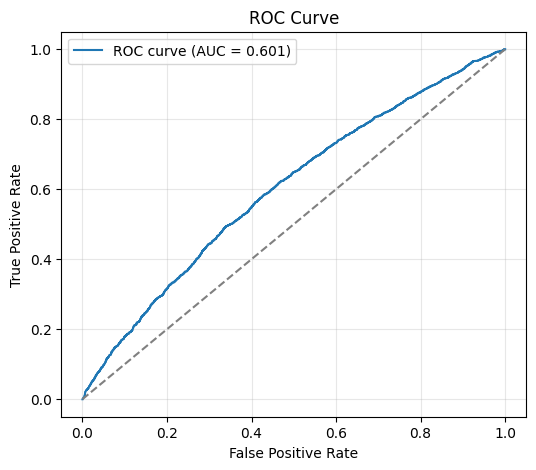

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.3f})")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Для логистической регрессии видим небольшое улучшение относительно результата с одномерным анализом. Из-за специфики данных, значительно улучшить результат не вышло. Но значение практически соответсвует бенчмарку на Kaggle - соответственно, работа проделана качественная.

In [ ]:
from sklearn.model_selection import train_test_split

target_class = "no_show"

binary_cols = [
    "storm_day_before",
    "patient_needs_companion"
]

numeric_cols = [
    "age",
    "average_temp_day",
    "average_rain_day",
    "max_rain_day"
]

categorical_prefixes = [
    "specialty_", "disability_", "appointment_month_",
    "rain_intensity_", "heat_intensity_",
    "appointment_shift_", "gender_"
]

ohe_cols = []
for pref in categorical_prefixes:
    matched = [c for c in df_updated.columns if c.startswith(pref)]
    ohe_cols.extend(matched)

predictors = numeric_cols + binary_cols + ohe_cols

df_updated["no_show_bin"] = df_updated[target_class].map({"no": 0, "yes": 1})

X = df_updated[predictors]
y = df_updated["no_show_bin"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


In [ ]:
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import (
    f1_score, roc_auc_score, classification_report,
    confusion_matrix, roc_curve
)
import matplotlib.pyplot as plt

print("ВАРИАНТ 2: SMOTE + Pipeline + RandomizedSearchCV")

# Пайплайн: масштабирование -> SMOTE -> логистическая регрессия
pipeline = ImbPipeline([
    ("scaler", StandardScaler()),
    ("smote", SMOTE(random_state=42)),
    ("classifier", LogisticRegression(
        random_state=42,
        max_iter=2000,
        solver="liblinear"
    ))
])

param_distributions = {
    "classifier__C": [0.001, 0.01, 0.1, 1.0, 10.0],
    "classifier__penalty": ["l1", "l2"],
    "classifier__class_weight": [None, "balanced"],
    "smote__k_neighbors": [3, 5, 7],
    "smote__sampling_strategy": [0.5, 0.75, 1.0]
}

random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    n_iter=15,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    scoring="f1",
    n_jobs=-1,
    random_state=42,
    verbose=1
)

random_search.fit(X_train, y_train)

print(f"\nЛучшие параметры: {random_search.best_params_}")
print(f"Лучший F1-score (CV): {random_search.best_score_:.4f}")

y_pred_smote = random_search.predict(X_test)
y_proba_smote = random_search.predict_proba(X_test)[:, 1]

f1_smote = f1_score(y_test, y_pred_smote)
roc_auc_smote = roc_auc_score(y_test, y_proba_smote)

print(f"\nРезультаты на тестовой выборке:")
print(f"F1-score: {f1_smote:.4f}")
print(f"ROC-AUC: {roc_auc_smote:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_smote))


ВАРИАНТ 2: SMOTE + Pipeline + RandomizedSearchCV
Fitting 5 folds for each of 15 candidates, totalling 75 fits

Лучшие параметры: {'smote__sampling_strategy': 0.75, 'smote__k_neighbors': 7, 'classifier__penalty': 'l2', 'classifier__class_weight': 'balanced', 'classifier__C': 1.0}
Лучший F1-score (CV): 0.2369

Результаты на тестовой выборке:
F1-score: 0.2358
ROC-AUC: 0.5858

Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.57      0.70      6031
           1       0.15      0.56      0.24       810

    accuracy                           0.57      6841
   macro avg       0.53      0.57      0.47      6841
weighted avg       0.82      0.57      0.65      6841



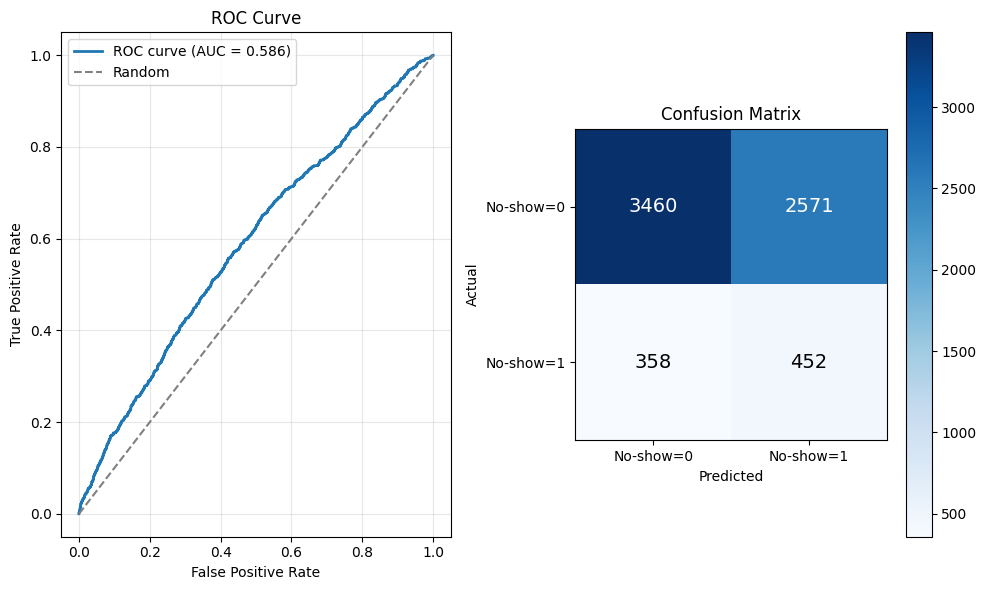

In [ ]:
best_model = random_search.best_estimator_
y_proba_best = best_model.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_proba_best)

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc_smote:.3f})", linewidth=2)
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
cm = confusion_matrix(y_test, y_pred_smote)
plt.imshow(cm, cmap="Blues", interpolation="nearest")
plt.colorbar()
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks([0, 1], ["No-show=0", "No-show=1"])
plt.yticks([0, 1], ["No-show=0", "No-show=1"])

for i in range(2):
    for j in range(2):
        plt.text(
            j, i, str(cm[i, j]),
            ha="center", va="center",
            color="white" if cm[i, j] > cm.max() / 2 else "black",
            fontsize=14
        )

plt.tight_layout()
plt.show()


Результаты же Random Forest получились относительно теми же, что и до многомерного анализа. Здесь больших изменений не наблюдаем, к сожалению.

**Общий вывод:** из-за того, что в данных не удалось обнаружить параметры, которые значительно влияют на целевую переменную, многомерный анализ не дал значительного роста метрик относительно одномерного анализа. Данные оказались достаточно "грязными", чтобы показать хороший рост метрик при базовом EDA, но недостаточно коррелирующими, чтобы показать заметный рост метрик при многомерном анализе.